In [8]:
# %matplotlib inline

import numpy as np
import h5py
import matplotlib.pyplot as plt
import scipy
from glob import glob
from scipy import signal
from matplotlib.ticker import FormatStrFormatter
from scipy.signal import detrend
from tqdm import tqdm
import obspy
from obspy.signal.trigger import recursive_sta_lta, plot_trigger, trigger_onset
import pickle as pkl
import traceback

import copy


import pandas as pd
import rasterio
from rasterio.plot import show
from scipy.stats import gaussian_kde

from datetime import timedelta
import datetime
import numpy as np
import matplotlib.dates as mdates
from matplotlib.ticker import FuncFormatter

import pyTMD
import numpy as np
        
import pyTMD.io
import pyTMD.predict
import pyTMD.tools
import pyTMD.utilities
import timescale.time

np.float_ = np.float64
import dascore as dc

def sintela_to_datetime(sintela_times):
    '''
    returns an array of datetime.datetime 
    ''' 
    
    days1970 = datetime.datetime.date(datetime.datetime(1970, 1, 1)).toordinal()

    # Vectorize everything
    converttime = np.vectorize(datetime.datetime.fromordinal)
    addday_lambda = lambda x : datetime.timedelta(days=x)
    adddays = np.vectorize(addday_lambda )
    
    day = days1970 + sintela_times/1e6/60/60/24
    thisDateTime = converttime(np.floor(day).astype(int))
    dayFraction = day-np.floor(day)
    thisDateTime = thisDateTime + adddays(dayFraction)

    return thisDateTime

def preprocessing_step(file):

    # Load data #
    f = h5py.File(file)
    attrs = f['Acquisition'].attrs
    data = f['Acquisition']['Raw[0]']['RawData'][:]
    this_time = f['Acquisition']['Raw[0]']['RawDataTime'][:]
    times = sintela_to_datetime(this_time)
    x = np.linspace(0,data.shape[1],data.shape[1]) * attrs['SpatialSamplingInterval']
    fs = attrs['PulseRate'] #sample rate

    if file[-9:-7] != '00':
        time_start = times[0] - datetime.timedelta(seconds=times[0].second, microseconds=times[0].microsecond)
        forward_step = np.arange(time_start, times[0], 500).shape[0]
        data_locator = np.array([int(i) for i in (this_time-this_time[0])/500]) + forward_step -1
    else:
        data_locator = np.array([int(i) for i in (this_time-this_time[0])/500])

    filled_data = np.zeros((int(fs*60),data.shape[1]))
    filled_data[:] = np.nan

    bp_top = 500
    bp_bottom = 2
    downsample_rate = int(fs/bp_top)

    #filter by freq
    sos = signal.butter(10, [bp_bottom,bp_top], 'bp', fs=fs, output='sos')
    filtered = signal.sosfiltfilt(sos, data, axis=0)
    #normalize
    normed_filtered = chan_norm(filtered)

    if data_locator[0]==0:
        filled_data[data_locator] = filtered

    else:
        first_filler = np.array([normed_filtered[0,:]]*data_locator[0])
        filled_data[:first_filler.shape[0],:] = first_filler

    mean_of_chans = np.nanmean(filled_data, axis=0)
    idx = np.where(np.isnan(filled_data))
    filled_data[idx] = np.take(mean_of_chans, idx[1])


    #FK filter
    ## rescale the times to the filled data
    if len(this_time) != int(fs*60):
        this_time = np.arange(this_time[0],int(this_time[0]+(500*fs*60)), 500)
    filled_times = sintela_to_datetime(this_time)
    new_format_times = time_fixer_4_fk(filled_times)

    dims = ('time', 'distance')
    patch = dc.Patch(data=filled_data, coords=dict(time=[np.datetime64(i) for i in new_format_times], distance=x), dims=dims)
    filt_cutoffs = np.array([500, 1500, 7000, 20000])

    fk_filtered = patch.slope_filter(filt=filt_cutoffs)

    fk_filtered_data = np.array(fk_filtered.data)

    # #normalize
    # data_normed_filtered_fk = chan_norm(fk_filtered_data)
    # data_normed_filtered_no_fk = chan_norm(filled_data)



    new_attrs = dict(attrs)

    if new_attrs['MeasurementStartTime'].decode('UTF-8')[17:19] == '00' and data.shape[0] != int(new_attrs['PulseRate']*60):
        new_attrs['Status'] = 'Corrupted'
    else:
        new_attrs['Status'] = 'Good'

    ## Downsample 
    filled_times = filled_times[::downsample_rate]
    filt_filled_data = fk_filtered_data[::downsample_rate,::5] #Skip every 5th channel

    new_attrs['PulseRate'] = new_attrs['PulseRate']/downsample_rate


    return filt_filled_data, filled_times, new_attrs

def foo(a, b):
    t = mdates.num2date(a)
    ms = str(t.microsecond)[:1]
    res = f"{t.hour:02}:{t.minute:02}:{t.second:02}.{ms}"
    return res

def chan_norm(das_data):

    data_normed = (das_data - np.mean(das_data, axis=0))/np.std(das_data, axis=0).T
    # data_normed_all_axis = (data_normed.T - np.mean(data_normed, axis=1))/np.std(data_normed, axis=1)   

    return data_normed

class DataStats:
    def __init__(self, data, attrs, times):
        self.sampling_rate = attrs["PulseRate"]
        self.npts = data.shape[0]
        self.starttime = times[0]
        # self.starttime.isoformat

class DAS:
    def __init__(self, id, data, attrs, times):
        self.id = id
        self.data = data
        self.stats = DataStats(data, attrs, times)


def obspy_stream_from_das(data, attrs,times):
    stats_default = {
        'network':'eastwind',
        'station':'',
        'location':'',
        'channel':'DAS',
        'starttime':times[0].strftime('%Y-%m-%dT%H:%M:%S.%fZ'),
        'endtime':times[-1].strftime('%Y-%m-%dT%H:%M:%S.%fZ'),
        'sampling_rate':attrs['PulseRate'],
        'delta':1/attrs['PulseRate'],
        'npts':0,
        'calib':1.0
    }

    streams = []
    for n,i in enumerate(data.T):
        tr = obspy.Trace(data=i,header=stats_default)
        # tr.stats.station = f'Channel {n}'
        tr.stats.npts = len(i)

        st = obspy.Stream(tr)
        streams.append(st)
    return streams

def parallel_event_finding(dummy):
    times_all,attrs,channel,all_data = dummy
    trigger_on=3.5, 
    trigger_off=1.2
    
    DAS_channel = DAS(channel, all_data, attrs, times_all)


    cft = recursive_sta_lta(DAS_channel.data, int(1 * attrs['PulseRate']), int(10 * attrs['PulseRate']))
    trigger_times = trigger_onset(cft, trigger_on, trigger_off)
    trigger_times_list = [trigger_times]     

    trigger_times_list_datetime = []

    for trigs_samp_time in trigger_times_list:
        trigger_times_list_datetime.append(times_all[trigs_samp_time])
    return {str(channel): trigger_times_list_datetime}


def time_fixer_4_fk(times):
    times_copy = times.copy()
    new_format_times = []
    for i in times_copy:
        if round(i.microsecond/500)*500 == 1000000:
            microsecond = 0
            second = i.second + 1
            minute = i.minute
            hour = i.hour
            day = i.day
            if second == 60:
                second = 0
                minute = minute+1

            if minute == 60:
                minute = 0
                hour=hour+1
            
            if hour == 24:
                hour = 0
                day = day+1
            
        else:
            microsecond = int(round(i.microsecond/500)*500)
            second = i.second
            minute = i.minute
            hour = i.hour
            day = i.day

        new_format_times.append(datetime.datetime(year=i.year,
                                                month=i.month,
                                                day=day,
                                                hour=hour,
                                                minute=minute,
                                                second=second,
                                                microsecond=microsecond))
    return new_format_times


import pathlib



import pandas as pd
from obspy import UTCDateTime
from obspy.clients.fdsn.mass_downloader import (
    GlobalDomain,
    Restrictions,
    MassDownloader,
)
from obspy.core import AttribDict
from pyproj import Proj
from multiprocessing import Pool

from quakemigrate import QuakeScan, Trigger
from quakemigrate.io import Archive, read_stations
from quakemigrate.lut import compute_traveltimes
from quakemigrate.signal.onsets import STALTAOnset
from quakemigrate.signal.pickers import GaussianPicker

%matplotlib widget

# Load the file list

In [29]:
files_list = sorted(glob('/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024*'))
file = files_list[6]

In [25]:
files_list = sorted(glob('/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024*'))
files_list = files_list[384:395]

In [26]:
files_list

['/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_11.18.00_UTC.h5',
 '/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_11.19.00_UTC.h5',
 '/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_23.07.11_UTC.h5',
 '/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_23.08.00_UTC.h5',
 '/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_23.09.00_UTC.h5',
 '/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_23.10.00_UTC.h5',
 '/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_23.11.00_UTC.h5',
 '/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_23.12.00_UTC.h5',
 '/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_23.13.00_UTC.h5',
 '/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024-12-18_23.14.00_UTC.h5',
 '/1-fnp/petasaur/p-

  0%|          | 0/11 [00:00<?, ?it/s]

 18%|█▊        | 2/11 [00:28<01:44, 11.60s/it]

Good
Unable to synchronously open file (bad object header version number)


 27%|██▋       | 3/11 [00:55<02:29, 18.64s/it]

Good


 55%|█████▍    | 6/11 [02:42<02:31, 30.34s/it]

Good


 82%|████████▏ | 9/11 [04:47<01:16, 38.25s/it]/tmp/ipykernel_3493597/1366153908.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()
100%|██████████| 11/11 [06:11<00:00, 33.73s/it]


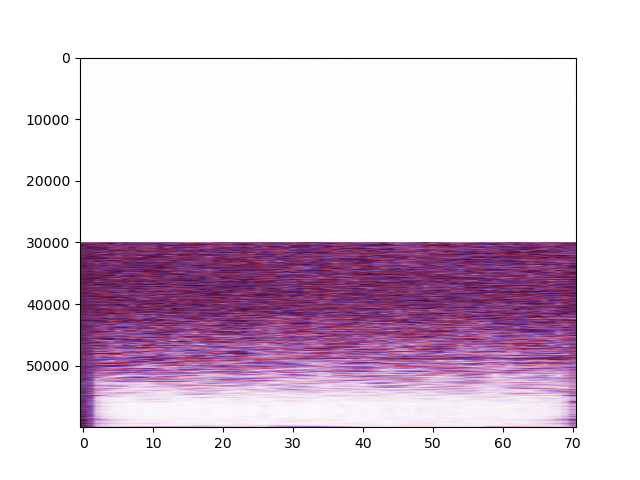

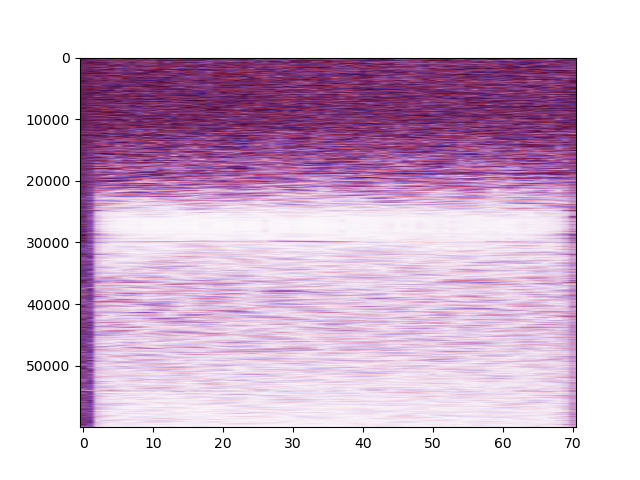

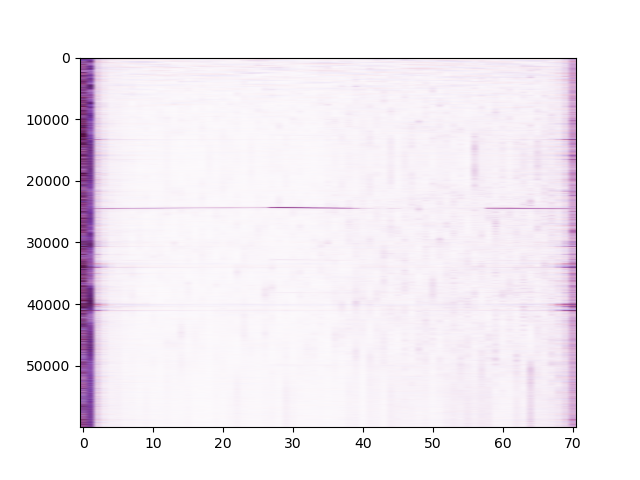

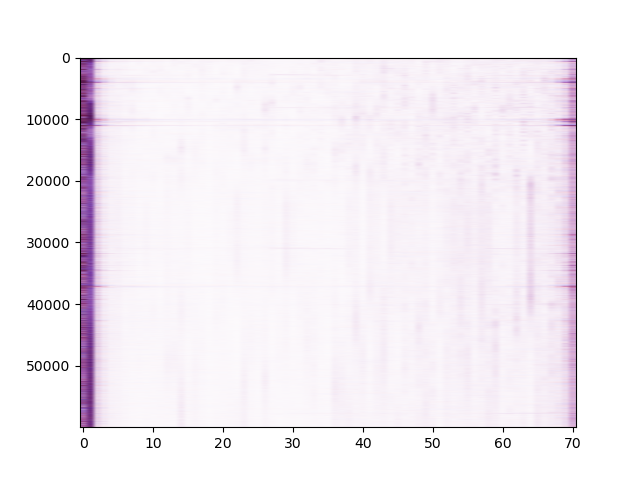

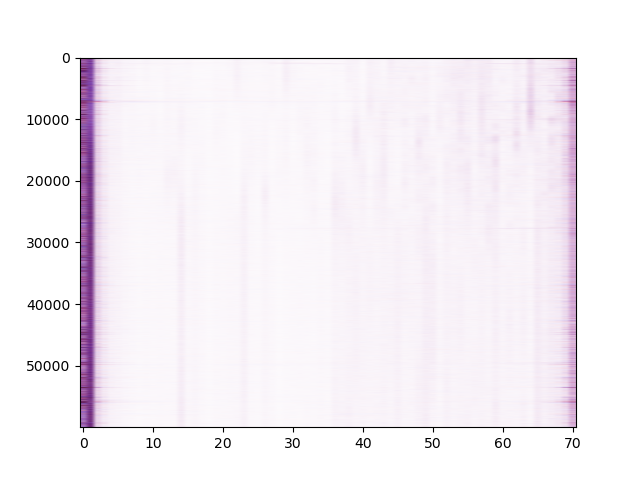

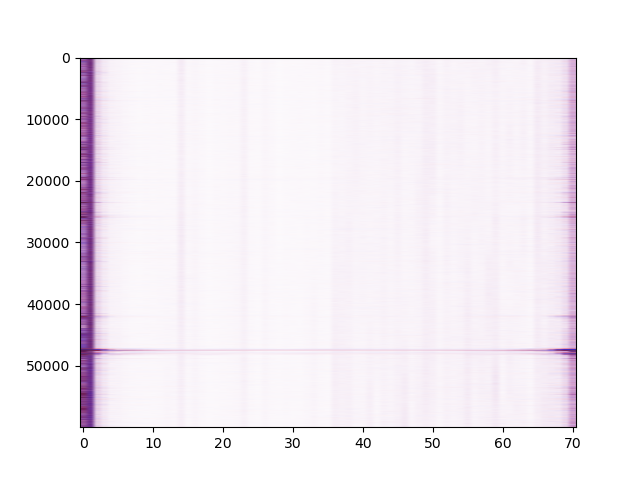

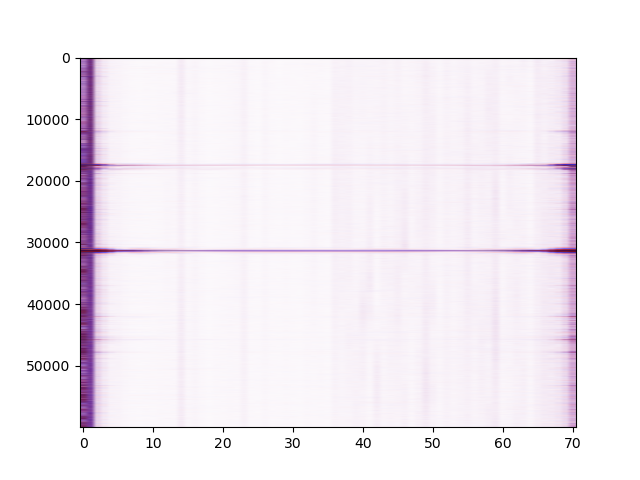

In [27]:
trigger_on = 3.5
trigger_off = 1.2
all_trigger_times = [[] for p in range(int(351 / 5))]

current_status = 'Good'
for i in tqdm(range(len(files_list))):


    if files_list[i][-9:-7] != '00' or i == 0 or current_status == 'Corrupted':

        try:
            filt_filled_data, times, attrs = preprocessing_step(files_list[i])

            current_status = attrs['Status']

            print(current_status)

        except Exception: 
            print(traceback.format_exc())
            
            continue

    else:
        
        first = copy.deepcopy(filt_filled_data)
        times_first = copy.deepcopy(times)
        try:
            filt_filled_data, times, attrs = preprocessing_step(files_list[i])
            current_status = attrs['Status']
        except Exception as e: 
            print(e)
            continue
        
        # overlap_data[:,:] = filt_filled_data

        all_data = np.concatenate((first,filt_filled_data), axis=0)
        times_all = np.concatenate((times_first,times), axis=0)

        # fig,ax = plt.subplots()
        # ax.plot(all_data[:,30])

        fig,ax = plt.subplots()
        ax.imshow(all_data, aspect='auto', vmin=-.1, vmax=.1,cmap='seismic')

        input_data_dict = {str(i):all_data[:,i] for i in range(all_data.shape[1])}

        new_iterable = [[times_all,dict(attrs),i,input_data_dict[i]] for i in input_data_dict]

        with Pool(32) as p:
            picks = p.map(parallel_event_finding,new_iterable)
        for n,e in enumerate(picks):
            try:
                all_trigger_times[n].extend(e[str(n)][0][:,0])
            except:
                continue
        
        # if len(trigger_times) == 0:
        #     continue
        # else:
        #     plot_trigger(DAS_channel, cft, trigger_on, trigger_off)




# with open('all_chan_all_trigger_times_overlapped_new_STALTA.pkl', 'wb') as file:
#     # Serialize and write the data to the file
#     pkl.dump(all_trigger_times, file)        

In [5]:
len(sorted(glob('/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024*')))*.31

234.35999999999999

In [4]:
all_trigs_flat_no_duplicates = [[] for lister in range(len(all_trigger_times))]
for n,i in enumerate(all_trigger_times):

    try:
        all_trigs_flat_no_duplicates[n].append(i[0])

        for k in range(1,len(i), 1):
            diff = i[k] - i[k-1]
            if diff < datetime.timedelta(seconds=0.01):
                # print('duplicate')
                continue
            else:
                all_trigs_flat_no_duplicates[n].append(i[k])
    except:
        continue

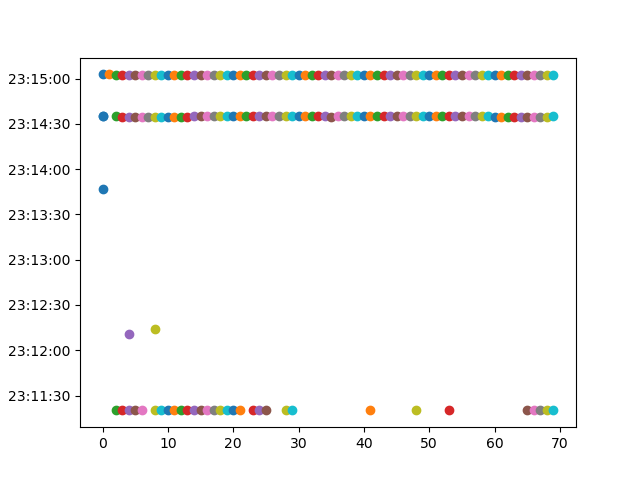

In [7]:
fig,ax = plt.subplots()
chans = np.arange(0,len(all_trigs_flat_no_duplicates),1)
for chan in chans:
    try:
        ax.scatter([chan]*len(all_trigs_flat_no_duplicates[chan]), all_trigs_flat_no_duplicates[chan])
    except:
        continue


# Fixing the bug with filling in data

In [56]:

# Load data #
f = h5py.File(file)
attrs = f['Acquisition'].attrs
data = f['Acquisition']['Raw[0]']['RawData'][:]
this_time = f['Acquisition']['Raw[0]']['RawDataTime'][:]
times = sintela_to_datetime(this_time)
x = np.linspace(0,data.shape[1],data.shape[1]) * attrs['SpatialSamplingInterval']
fs = attrs['PulseRate'] #sample rate


if file[-9:-7] != '00':
    time_start = times[0] - datetime.timedelta(seconds=times[0].second, microseconds=times[0].microsecond)
    forward_step = np.arange(time_start, times[0], 500).shape[0]
    data_locator = np.array([int(i) for i in (this_time-this_time[0])/500]) + forward_step -1
else:
    data_locator = np.array([int(i) for i in (this_time-this_time[0])/500])

filled_data = np.zeros((int(fs*60),data.shape[1]))
filled_data[:] = np.nan
filled_times = np.zeros((int(fs*60)), dtype=object)

bp_top = 200
bp_bottom = 1
downsample_rate = int(fs/bp_top)

#filter by freq
sos = signal.butter(10, [bp_bottom,bp_top], 'bp', fs=fs, output='sos')
filtered = signal.sosfiltfilt(sos, data, axis=0)

if data_locator[0]==0:
    filled_data[data_locator] = filtered

else:
    first_filler = np.array([filtered[:,0]]*data_locator[0])
    filled_data[:first_filler.shape[0],:] = first_filler

#FK filter


new_format_times = time_fixer_4_fk(times)
print(new_format_times)
dims = ('time', 'distance')
patch = dc.Patch(data=filtered, coords=dict(time=[np.datetime64(i) for i in new_format_times], distance=x), dims=dims)
filt_cutoffs = np.array([500, 1500, 7000, 20000])

fk_filtered = patch.slope_filter(filt=filt_cutoffs)
fk_filtered_data = np.array(fk_filtered.data)


#normalize
data_normed_filtered = chan_norm(fk_filtered_data)





# this_time = np.arange(0,int(fs*60))* 500 + this_time[0]
# print(this_time)
# print(filled_data.shape)
# print(first_filler.shape)
filled_data = np.zeros((int(fs*60),data_normed_filtered.shape[1]))
filled_times = np.zeros((int(fs*60)), dtype=object)




if data_locator[0]==0:
    filled_data[data_locator] = data_normed_filtered

else:
    first_filler = np.array([data_normed_filtered[:,0]]*data_locator[0])
    filled_data[:first_filler.shape[0],:] = first_filler

filt_filled_data = filled_data

filled_times[data_locator] = times
# filled_data[data_locator] = data_normed_filtered.T

# filt_filled_data = filled_data

## Downsample 
filled_times = filled_times[::downsample_rate]
filt_filled_data = filt_filled_data[::downsample_rate,::5] #Skip every 5th channel
new_dict = dict(attrs)
new_dict['PulseRate'] = new_dict['PulseRate']/downsample_rate


[datetime.datetime(2024, 12, 18, 8, 45), datetime.datetime(2024, 12, 18, 8, 45, 0, 500), datetime.datetime(2024, 12, 18, 8, 45, 0, 1000), datetime.datetime(2024, 12, 18, 8, 45, 0, 1500), datetime.datetime(2024, 12, 18, 8, 45, 0, 2000), datetime.datetime(2024, 12, 18, 8, 45, 0, 2500), datetime.datetime(2024, 12, 18, 8, 45, 0, 3000), datetime.datetime(2024, 12, 18, 8, 45, 0, 3500), datetime.datetime(2024, 12, 18, 8, 45, 0, 4000), datetime.datetime(2024, 12, 18, 8, 45, 0, 4500), datetime.datetime(2024, 12, 18, 8, 45, 0, 5000), datetime.datetime(2024, 12, 18, 8, 45, 0, 5500), datetime.datetime(2024, 12, 18, 8, 45, 0, 6000), datetime.datetime(2024, 12, 18, 8, 45, 0, 6500), datetime.datetime(2024, 12, 18, 8, 45, 0, 7000), datetime.datetime(2024, 12, 18, 8, 45, 0, 7500), datetime.datetime(2024, 12, 18, 8, 45, 0, 8000), datetime.datetime(2024, 12, 18, 8, 45, 0, 8500), datetime.datetime(2024, 12, 18, 8, 45, 0, 9000), datetime.datetime(2024, 12, 18, 8, 45, 0, 9500), datetime.datetime(2024, 12, 1

CoordError: Coordinate time is not evenly sampled as required by pad

[datetime.datetime(2024, 12, 18, 8, 45), datetime.datetime(2024, 12, 18, 8, 45, 0, 500), datetime.datetime(2024, 12, 18, 8, 45, 0, 1000), datetime.datetime(2024, 12, 18, 8, 45, 0, 1500), datetime.datetime(2024, 12, 18, 8, 45, 0, 2000), datetime.datetime(2024, 12, 18, 8, 45, 0, 2500), datetime.datetime(2024, 12, 18, 8, 45, 0, 3000), datetime.datetime(2024, 12, 18, 8, 45, 0, 3500), datetime.datetime(2024, 12, 18, 8, 45, 0, 4000), datetime.datetime(2024, 12, 18, 8, 45, 0, 4500), datetime.datetime(2024, 12, 18, 8, 45, 0, 5000), datetime.datetime(2024, 12, 18, 8, 45, 0, 5500), datetime.datetime(2024, 12, 18, 8, 45, 0, 6000), datetime.datetime(2024, 12, 18, 8, 45, 0, 6500), datetime.datetime(2024, 12, 18, 8, 45, 0, 7000), datetime.datetime(2024, 12, 18, 8, 45, 0, 7500), datetime.datetime(2024, 12, 18, 8, 45, 0, 8000), datetime.datetime(2024, 12, 18, 8, 45, 0, 8500), datetime.datetime(2024, 12, 18, 8, 45, 0, 9000), datetime.datetime(2024, 12, 18, 8, 45, 0, 9500), datetime.datetime(2024, 12, 1

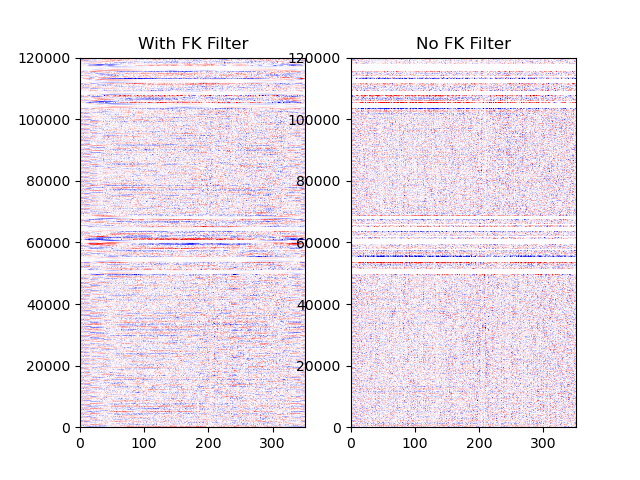

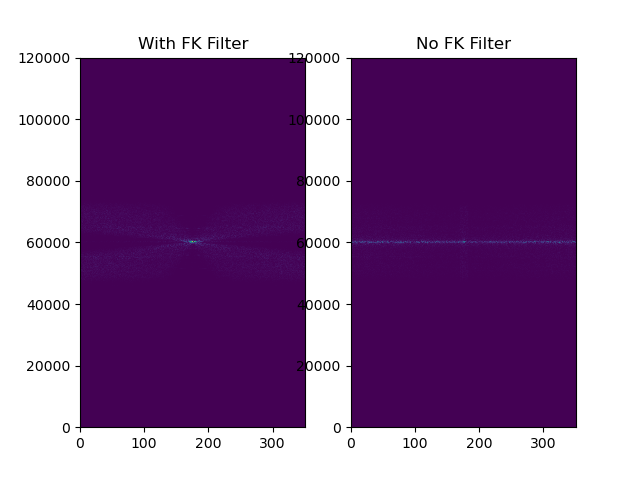

In [57]:
files_list = sorted(glob('/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024*'))
file= files_list[231]

# Load data #
f = h5py.File(file)
attrs = f['Acquisition'].attrs
data = f['Acquisition']['Raw[0]']['RawData'][:]
this_time = f['Acquisition']['Raw[0]']['RawDataTime'][:]
times = sintela_to_datetime(this_time)
x = np.linspace(0,data.shape[1],data.shape[1]) * attrs['SpatialSamplingInterval']
fs = attrs['PulseRate'] #sample rate

if file[-9:-7] != '00':
    time_start = times[0] - datetime.timedelta(seconds=times[0].second, microseconds=times[0].microsecond)
    forward_step = np.arange(time_start, times[0], 500).shape[0]
    data_locator = np.array([int(i) for i in (this_time-this_time[0])/500]) + forward_step -1
else:
    data_locator = np.array([int(i) for i in (this_time-this_time[0])/500])

filled_data = np.zeros((int(fs*60),data.shape[1]))
filled_data[:] = np.nan


bp_top = 200
bp_bottom = 1
downsample_rate = int(fs/bp_top)

#filter by freq
sos = signal.butter(10, [bp_bottom,bp_top], 'bp', fs=fs, output='sos')
filtered = signal.sosfiltfilt(sos, data, axis=0)

if data_locator[0]==0:
    filled_data[data_locator] = filtered

else:
    first_filler = np.array([filtered[:,0]]*data_locator[0])
    filled_data[:first_filler.shape[0],:] = first_filler

mean_of_chans = np.nanmean(filled_data, axis=0)
idx = np.where(np.isnan(filled_data))
filled_data[idx] = np.take(mean_of_chans, idx[1])

#FK filter
## rescale the times to the filled data
if len(this_time) != int(fs*60):
    this_time = np.arange(this_time[0],int(this_time[0]+(500*fs*60)), 500)
filled_times = sintela_to_datetime(this_time)
new_format_times = time_fixer_4_fk(filled_times)
print(new_format_times)
dims = ('time', 'distance')
patch = dc.Patch(data=filled_data, coords=dict(time=[np.datetime64(i) for i in new_format_times], distance=x), dims=dims)
filt_cutoffs = np.array([500, 1500, 7000, 20000])

fk_filtered = patch.slope_filter(filt=filt_cutoffs)
fk_filtered_data = np.array(fk_filtered.data)

#normalize
data_normed_filtered_fk = chan_norm(fk_filtered_data)
data_normed_filtered_no_fk = chan_norm(filled_data)

new_attrs = dict(attrs)

if new_attrs['MeasurementStartTime'].decode('UTF-8')[17:19] == '00' and data.shape[0] != int(new_attrs['PulseRate']*60):
    new_attrs['Status'] = 'Corrupted'
else:
    new_attrs['Status'] = 'Good'

print(new_attrs['Status'])

ymax = int(data_normed_filtered_fk.shape[0]/2) +1000
ymin = int(data_normed_filtered_fk.shape[0]/2) -1000
xmax = int(data_normed_filtered_fk.shape[1]/2) +20
xmin = int(data_normed_filtered_fk.shape[1]/2) -20

fig,(ax1,ax2)=plt.subplots(1,2)

ax1.set_title('With FK Filter')
ax1.pcolorfast(data_normed_filtered_fk, cmap='seismic', vmin=-10, vmax=10)

ax2.set_title('No FK Filter')
ax2.pcolorfast(data_normed_filtered_no_fk, cmap='seismic', vmin=-10, vmax=10)


fig,(ax1,ax2)=plt.subplots(1,2)

ax1.set_title('With FK Filter')
ax1.pcolorfast(np.abs(np.fft.fftshift(np.fft.fft2(data_normed_filtered_fk))), vmax=5e5, vmin=0)
# ax1.set_ylim([ymin,ymax])
# ax1.set_xlim([xmin,xmax])

ax2.set_title('No FK Filter')
ax2.pcolorfast(np.abs(np.fft.fftshift(np.fft.fft2(data_normed_filtered_no_fk))), vmax=5e5, vmin=0)
# ax2.set_ylim([ymin,ymax])
# ax2.set_xlim([xmin,xmax])

In [58]:
new_attrs

{'AcquisitionId': np.bytes_(b'RunName/RunNumber'),
 'BandDataMaxUserValue': np.float64(0.0),
 'BandDataMinUserValue': np.float64(0.0),
 'Build': np.bytes_(b'5.19.6_P'),
 'CommitHash': np.bytes_(b'e0de8303'),
 'DasInstrumentBox': np.bytes_(b'ONYXONYX-0204'),
 'DetectionAccuracy': np.bytes_(b'Not Applicable'),
 'FFID': np.int64(0),
 'FacilityId': np.bytes_(b'WellName2'),
 'FiberID': np.int64(2),
 'GaugeLength': np.float64(6.380952536802641),
 'GaugeLengthUnit': np.bytes_(b'm'),
 'Hostname': np.bytes_(b'ONYX-0204'),
 'MaximumFrequency': np.float64(1000.0),
 'MeasurementStartTime': np.bytes_(b'2024-12-18T08:45:00.000000+00:00'),
 'MinimumFrequency': np.float64(0.0),
 'NumberOfLoci': np.int64(351),
 'OpticalPath': np.bytes_(b'OpticalPath'),
 'PulseRate': np.float64(2000.0),
 'PulseRateUnit': np.bytes_(b'Hz'),
 'PulseWidth': np.float64(20.0),
 'PulseWidthUnit': np.bytes_(b'ns'),
 'SoftwareVersion': np.bytes_(b'7320'),
 'SpatialSamplingInterval': np.float64(6.380952536802641),
 'SpatialSampli

In [42]:
new_attrs = dict(attrs)

In [39]:
new_attrs['Status'] = 'Corrupted'

In [55]:
if new_attrs['MeasurementStartTime'].decode('UTF-8')[17:19] == '00' and data.shape[0] != int(new_attrs['PulseRate']*60):
    print('stuff')

stuff


In [54]:
data.shape[0] != int(new_attrs['PulseRate']*60):

104759

# Testing the filtering

In [12]:
# Load data #
files_list = sorted(glob('/1-fnp/petasaur/p-jbod1/antarctica2425/incoming/Eastwind_decimator_2024*'))
file = files_list[230]

# Load data #
f = h5py.File(file)
attrs = f['Acquisition'].attrs
data = f['Acquisition']['Raw[0]']['RawData'][:]
this_time = f['Acquisition']['Raw[0]']['RawDataTime'][:]
times = sintela_to_datetime(this_time)
x = np.linspace(0,data.shape[1],data.shape[1]) * attrs['SpatialSamplingInterval']


fs = attrs['PulseRate'] #sample rate
bp_top = 500
bp_bottom = 2
downsample_rate = int(fs/bp_top)

#filter by freq
sos = signal.butter(10, [bp_bottom,bp_top], 'bp', fs=fs, output='sos')
filtered = signal.sosfiltfilt(sos, data, axis=0)

#FK filter
new_format_times = time_fixer_4_fk(times)
dims = ('time', 'distance')
patch = dc.Patch(data=filtered, coords=dict(time=[np.datetime64(i) for i in new_format_times], distance=x), dims=dims)
filt_cutoffs = np.array([500, 1500, 7000, 20000])

fk_filtered = patch.slope_filter(filt=filt_cutoffs)
fk_filtered_data = np.array(fk_filtered.data)


#normalize
data_normed_filtered_fk = chan_norm(fk_filtered_data)
data_normed_filtered_no_fk = chan_norm(filtered)

ymax = int(data_normed_filtered_fk.shape[0]/2) +1000
ymin = int(data_normed_filtered_fk.shape[0]/2) -1000
xmax = int(data_normed_filtered_fk.shape[1]/2) +20
xmin = int(data_normed_filtered_fk.shape[1]/2) -20

fig,(ax1,ax2)=plt.subplots(1,2)

ax1.set_title('With FK Filter')
ax1.pcolorfast(data_normed_filtered_fk, cmap='seismic', vmin=-10, vmax=10)

ax2.set_title('No FK Filter')
ax2.pcolorfast(data_normed_filtered_no_fk, cmap='seismic', vmin=-10, vmax=10)


fig,(ax1,ax2)=plt.subplots(1,2)

ax1.set_title('With FK Filter')
ax1.pcolorfast(np.abs(np.fft.fftshift(np.fft.fft2(data_normed_filtered_fk))), vmax=5e5, vmin=0)
# ax1.set_ylim([ymin,ymax])
# ax1.set_xlim([xmin,xmax])

ax2.set_title('No FK Filter')
ax2.pcolorfast(np.abs(np.fft.fftshift(np.fft.fft2(data_normed_filtered_no_fk))), vmax=5e5, vmin=0)
# ax2.set_ylim([ymin,ymax])
# ax2.set_xlim([xmin,xmax])

CoordError: Coordinate time is not evenly sampled as required by pad

In [ ]:

# times_copy = times.copy()
# new_format_times = []
# for i in times_copy:
#     if round(i.microsecond/500)*500 == 1000000:
#         microsecond = 0
#         second = i.second + 1
#         minute = i.minute
#         hour = i.hour
#         day = i.day
#         if second == 60:
#             second = 0
#             minute = minute+1

#         if minute == 60:
#             minute = 0
#             hour=hour+1
        
#         if hour == 24:
#             hour = 0
#             day = day+1
        
#     else:
#         microsecond = int(round(i.microsecond/500)*500)
#         second = i.second
#         minute = i.minute
#         hour = i.hour
#         day = i.day

#     new_format_times.append(datetime.datetime(year=i.year,
#                                             month=i.month,
#                                             day=day,
#                                             hour=hour,
#                                             minute=minute,
#                                             second=second,
#                                             microsecond=microsecond))


In [117]:
dims = ('time', 'distance')
patch = dc.Patch(data=filtered, coords=dict(time=[np.datetime64(i) for i in new_format_times], distance=x), dims=dims)
filt_cutoffs = np.array([0, 400, 8000, np.inf])

fk_filtered = patch.slope_filter(filt=filt_cutoffs)
fk_filtered_data = np.array(fk_filtered.data)


In [43]:
all_trigs_flat = []
for n,i in enumerate(all_trigger_times):
    try:
        for q in i:

            for trig in np.array(q)[:,0]:

                all_trigs_flat.append(trig)

    except:
        continue

In [46]:
all_trigger_times[0]

[]

In [45]:
for n,i in enumerate(all_trigger_times):
    print(i)

[]
[]
[]
[]
[]
[]
[datetime.datetime(2024, 12, 19, 3, 18, 5, 130002)]
[datetime.datetime(2024, 12, 19, 3, 15, 8, 369998), datetime.datetime(2024, 12, 19, 3, 18, 40, 45001), datetime.datetime(2024, 12, 19, 3, 18, 40, 45001)]
[datetime.datetime(2024, 12, 19, 3, 15, 8, 355001), datetime.datetime(2024, 12, 19, 3, 18, 39, 950001), datetime.datetime(2024, 12, 19, 3, 18, 39, 950001)]
[datetime.datetime(2024, 12, 19, 3, 15, 8, 355001), datetime.datetime(2024, 12, 19, 3, 18, 39, 974995), datetime.datetime(2024, 12, 19, 3, 18, 39, 974995)]
[datetime.datetime(2024, 12, 19, 3, 15, 8, 390003), datetime.datetime(2024, 12, 19, 3, 18, 39, 990002), datetime.datetime(2024, 12, 19, 3, 18, 39, 969996)]
[]
[]
[]
[]
[]
[datetime.datetime(2024, 12, 19, 3, 13, 14, 900003)]
[datetime.datetime(2024, 12, 19, 3, 13, 14, 924998)]
[]
[]
[datetime.datetime(2024, 12, 19, 3, 13, 14, 950003)]
[]
[]
[datetime.datetime(2024, 12, 19, 3, 13, 14, 990005)]
[]
[]
[]
[datetime.datetime(2024, 12, 19, 3, 15, 8, 514998), datetime

In [ ]:
all_trigs_flat = []
for n,i in enumerate(all_trigger_times):
    try:
        for q in i:

            for trig in np.array(q)[:,0]:

                all_trigs_flat.append(trig)

    except:
        continue

all_trigs_flat = sorted(all_trigs_flat)

all_trigs_flat_no_duplicates = [all_trigs_flat[0]]

for k in range(1,len(all_trigs_flat), 1):
    diff = all_trigs_flat[k] - all_trigs_flat[k-1]
    if diff < datetime.timedelta(seconds=0.01):
        # print('duplicate')
        continue
    else:
        all_trigs_flat_no_duplicates.append(all_trigs_flat[k])

IndexError: list index out of range

NameError: name 'all_trigs_flat_no_duplicates' is not defined

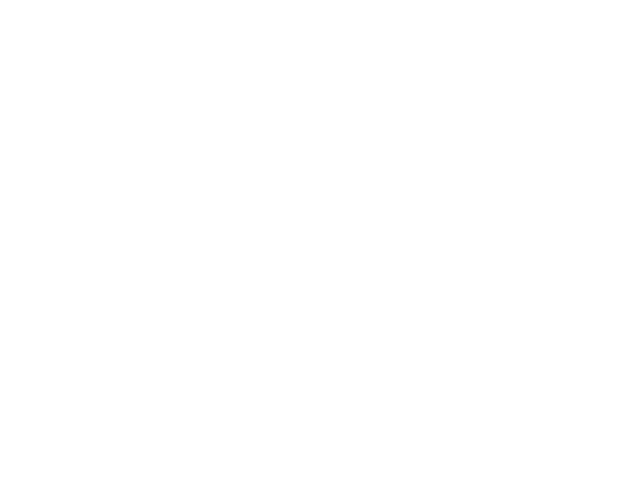

In [24]:
fig = plt.figure()
plt.hist(all_trigs_flat_no_duplicates, bins =25)

In [2]:
# available model list
model_list = sorted(pyTMD.io.model.ocean_elevation())
# display widgets for setting directory and model
TMDwidgets = pyTMD.tools.widgets()
TMDwidgets.model.options = model_list
TMDwidgets.model.value = 'GOT4.10_nc'
TMDwidgets.VBox([
    TMDwidgets.directory,
    TMDwidgets.model,
    TMDwidgets.compress,
    TMDwidgets.datepick
])

In [3]:
# default coordinates to use
LAT,LON = (-77.777664,167.868027)
m = pyTMD.tools.leaflet(center=(LAT,LON), zoom=7,
    zoom_control=True, marker_control=True,
    attribution=False)
# show map
m.map

Map(center=[-77.777664, 167.868027], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title…

In [14]:
# get model parameters
model = pyTMD.io.model(TMDwidgets.directory.value,
    compressed=TMDwidgets.compress.value
   ).elevation(TMDwidgets.model.value)

# convert from calendar date to days relative to Jan 1, 1992 (48622 MJD)
YMD = TMDwidgets.datepick.value
# calculate a weeks forecast every minute
minutes = np.arange(7*1440)
# convert time from MJD to days relative to Jan 1, 1992 (48622 MJD)
ts = timescale.from_calendar(YMD.year, YMD.month,
    YMD.day, minute=minutes)
hours = minutes/60.0

# create plot with tidal displacements, high and low tides and dates
fig,ax1 = plt.subplots(num=1)
xmax = np.ceil(hours[-1]).astype('i')
l1, = ax1.plot([], [], 'k')
l2, = ax1.plot([], [], 'r*')
l3, = ax1.plot([], [], 'b*')
for h in range(24,xmax,24):
    ax1.axvline(h,color='gray',lw=0.5,ls='dashed',dashes=(11,5))
ax1.set_xlim(0,xmax)
ax1.set_ylabel(f'{model.name} Tidal Displacement [cm]')
args = (YMD.year,YMD.month,YMD.day)
ax1.set_xlabel('Time from {0:4d}-{1:02d}-{2:02d} UTC [Hours]'.format(*args))
ttl = ax1.set_title(None)
fig.subplots_adjust(left=0.11,right=0.98,bottom=0.10,top=0.95)

# read tidal constants and interpolate to leaflet points
if model.format in ('OTIS','ATLAS-compact','TMD3'):
    constituents = pyTMD.io.OTIS.read_constants(
        model.grid_file, model.model_file,
        model.projection, type=model.type,
        grid=model.file_format)
    c = constituents.fields
    DELTAT = np.zeros_like(ts.tide)
elif (model.format == 'ATLAS-netcdf'):
    constituents = pyTMD.io.ATLAS.read_constants(
        model.grid_file, model.model_file,
        type=model.type, compressed=model.compressed)
    c = constituents.fields
    DELTAT = np.zeros_like(ts.tide)
elif model.format in ('GOT-ascii', 'GOT-netcdf'):
    constituents = pyTMD.io.GOT.read_constants(
        model.model_file, grid=model.file_format,
        compressed=model.compressed)
    c = constituents.fields
    # delta time (TT - UT1)
    DELTAT = ts.tt_ut1
elif (model.format == 'FES-netcdf'):
    constituents = pyTMD.io.FES.read_constants(model.model_file,
        type=model.type, version=model.version,
        compressed=model.compressed)
    c = model.constituents
    # delta time (TT - UT1)
    DELTAT = ts.tt_ut1

# update the tide prediction and plot
def update_tide_prediction(*args):
    # leaflet location
    LAT,LON = np.copy(m.marker.location)
    # verify longitudes
    LON = m.wrap_longitudes(LON)
    if model.format in ('OTIS','ATLAS-compact','TMD3'):
        amp,ph,D = pyTMD.io.OTIS.interpolate_constants(
            np.atleast_1d(LON), np.atleast_1d(LAT),
            constituents, model.projection, type=model.type,
            method='spline', extrapolate=True)
    elif (model.format == 'ATLAS-netcdf'):
        amp,ph,D = pyTMD.io.ATLAS.interpolate_constants(
            np.atleast_1d(LON), np.atleast_1d(LAT),
            constituents, type=model.type, scale=model.scale,
            method='spline', extrapolate=True)
    elif model.format in ('GOT-ascii', 'GOT-netcdf'):
        amp,ph = pyTMD.io.GOT.interpolate_constants(
            np.atleast_1d(LON), np.atleast_1d(LAT),
            constituents, scale=model.scale,
            method='spline', extrapolate=True)
    elif (model.format == 'FES-netcdf'):
        amp,ph = pyTMD.io.FES.interpolate_constants(
            np.atleast_1d(LON), np.atleast_1d(LAT),
            constituents, scale=model.scale,
            method='spline', extrapolate=True)
    # calculate complex phase in radians for Euler's
    cph = -1j*ph*np.pi/180.0
    # calculate constituent oscillation
    hc = amp*np.exp(cph)
    # predict tidal elevations at time and infer minor corrections
    TIDE = pyTMD.predict.time_series(ts.tide, hc, c,
        deltat=DELTAT, corrections=model.corrections)
    MINOR = pyTMD.predict.infer_minor(ts.tide, hc, c,
        deltat=DELTAT, corrections=model.corrections)
    TIDE.data[:] += MINOR.data[:]
    # convert to centimeters
    TIDE.data[:] *= 100.0

    # differentiate to calculate high and low tides
    diff = np.zeros_like(ts.tide, dtype=np.float64)
    # forward differentiation for starting point
    diff[0] = TIDE.data[1] - TIDE.data[0]
    # backward differentiation for end point
    diff[-1] = TIDE.data[-1] - TIDE.data[-2]
    # centered differentiation for all others
    diff[1:-1] = (TIDE.data[2:] - TIDE.data[0:-2])/2.0
    # indices of high and low tides
    htindex, = np.nonzero((np.sign(diff[0:-1]) >= 0) & (np.sign(diff[1:]) < 0))
    ltindex, = np.nonzero((np.sign(diff[0:-1]) <= 0) & (np.sign(diff[1:]) > 0))
    # update plot data
    l1.set_data(hours, TIDE.data)
    l2.set_data(hours[htindex], TIDE.data[htindex])
    l3.set_data(hours[ltindex], TIDE.data[ltindex])
    # update plot title
    ttl.set_text(u'{0:0.6f}\u00b0N {1:0.6f}\u00b0E'.format(LAT,LON))
    ax1.relim()
    ax1.autoscale_view()
    fig.canvas.draw()

    return TIDE


# run tide prediction at initial location
TIDE = update_tide_prediction()

# watch marker location for changes
m.marker_text.observe(update_tide_prediction)

In [15]:
datetime_tides = [datetime.datetime(year=2024, month=12, day=17) + datetime.timedelta(hours=i) for i in hours]


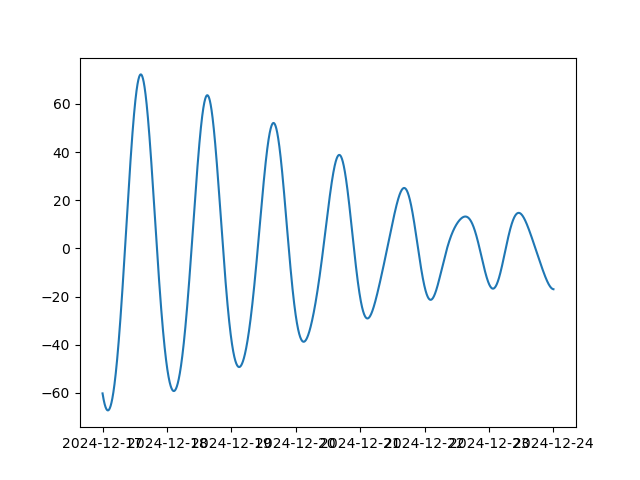

In [16]:
fig, ax = plt.subplots()
ax.plot(datetime_tides, TIDE.data)